# Single cell analysis of CCRCC patient tumors with respect to normal tissue

## Aim of study

The goal of this analysis is to determine if tumor cells expressed ASS1. While it is known that the ASS1 gene is usually shutdown in CCRCC tumors, We posit that some cells may still be expressing ASS1, giving them the ability to metastasis. Wew use a single cell dataset obtained from Young et al.: https://www.science.org/doi/10.1126/science.aat1699

## Analysis

### Setting up environment

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import decoupler as dc
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.5 scipy==1.7.3 pandas==1.4.2 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.10 pynndescent==0.5.4


In [3]:
results_file = 'write/pbmc3k.h5ad'  # the file that will store the analysis results

### Loading data

Data was downloaded from https://www.science.org/doi/10.1126/science.aat1699

In [4]:
adata = sc.read_10x_mtx(
    '../data/aat1699_DataS1/',  # the directory with the `.mtx` file
    var_names='gene_symbols',   # use gene symbols for the variable names (variables-axis index)
    cache=True)                 # write a cache file for faster subsequent reading

... reading from cache file cache/..-data-aat1699_DataS1-matrix.h5ad


### Pre-processing data

In [5]:
adata.var_names_make_unique()  # this is u'nnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [6]:
adata

AnnData object with n_obs × n_vars = 125139 × 33694
    var: 'gene_ids'

In [7]:
meta = pd.read_csv('../support/cell_annotations.csv', sep=";").set_index('DropletID')
meta = meta.loc[adata.obs.index.intersection(meta.index)]
meta.Compartment.unique()
adata.obs = adata.obs.merge(meta, left_index=True, right_index=True)

In [8]:
adata.obs.Source.unique()

array(['Wilms3_Kid_N_C_ldc_1_1', 'Wilms3_Kid_N_M_ldc_1_1',
       'Wilms3_Kid_N_P_ldc_1_1', 'Wilms3_Kid_T_ldc_1_1',
       'Wilms3_Kid_T_ldc_1_2', 'Wilms3_Kid_T_ldc_1_3',
       'Wilms3_Ure_N_ldc_1_1', 'Wilms2_Kid_N_C_ldc_1_1',
       'Wilms2_Kid_N_M_ldc_1_1', 'Wilms2_Kid_N_P_ldc_1_1',
       'Wilms2_Kid_T_ldc_1_1', 'Wilms2_Kid_T_ldc_1_2',
       'Wilms2_Kid_T_ldc_1_3', 'Wilms2_Ure_N_ldc_1_1',
       'Wilms1_Kid_R_ldc_1_1', 'Wilms1_Kid_R_ldc_1_2',
       'Wilms1_Kid_R_ldc_1_3', 'Wilms1_Kid_N_ldc_1_1',
       'Wilms1_Kid_N_ldc_1_2', 'Wilms1_Kid_T_ldc_1_1',
       'Wilms1_Kid_T_ldc_1_2', 'Wilms1_Kid_T_ldc_1_3',
       'VHL_Kid_N_ldc_1_1', 'VHL_Kid_N_ldc_1_2', 'VHL_Kid_N_ldc_2_1',
       'VHL_Kid_N_ldc_2_2', 'VHL_Kid_T_ldc_1_1', 'VHL_Kid_T_ldc_1_2',
       'RCC3_Kid_N_ldc_1_1', 'RCC3_Kid_N_ldc_1_2', 'RCC3_Kid_N_ldc_2_1',
       'RCC3_Kid_T_ldc_1_1', 'RCC3_Kid_T_ldc_1_2', 'RCC3_Kid_T_ldc_1_3',
       'RCC3_Kid_T_ldc_1_4', 'RCC3_Ure_N_ldc_1_1', 'RCC2_Kid_N_ldc_1_1',
       'RCC2_Kid_N_ldc_1

There are 3 CCRCC patients, but it seems that something went wrong with the third patient. There is barelly any tumor cells. Thus we remove patient 3 and focus on patient 1 and 2.

In [9]:
adata = adata[np.isin(adata.obs.Compartment, ['Normal_Epithelium_and_Vascular_without_PT','Tumour_Epithelium_and_Vascular','Normal_Proximal_Tubules','Normal_Immune','Tumour_Immune']) & (np.array(["RCC1" in i for i in list(adata.obs.Source)]) | np.array(["RCC2" in i for i in list(adata.obs.Source)]) | np.array(["VHL_" in i for i in list(adata.obs.Source)]))]

normalizing counts per cell


/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


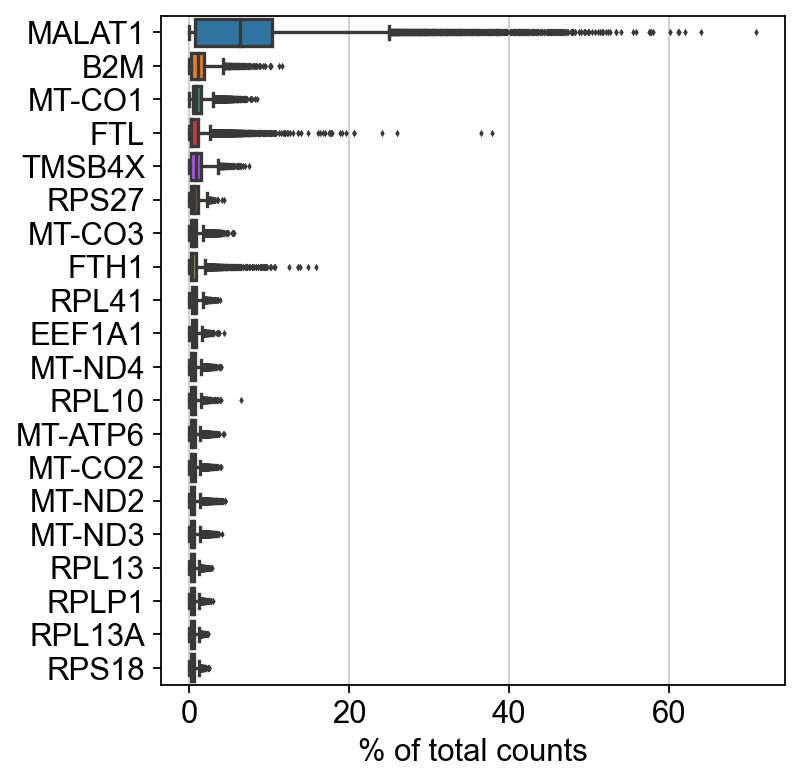

In [10]:
sc.pl.highest_expr_genes(adata, n_top=20, )

### Filtering and cleaning data

We follow the classic scanpy tutorial

In [11]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 9107 genes that are detected in less than 3 cells


In [12]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

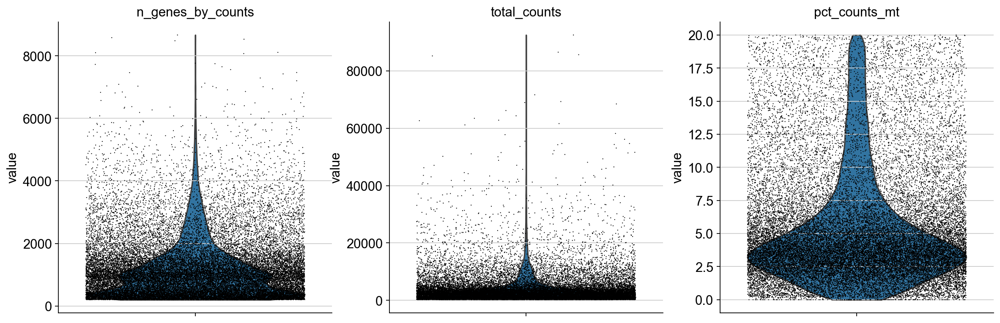

In [13]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

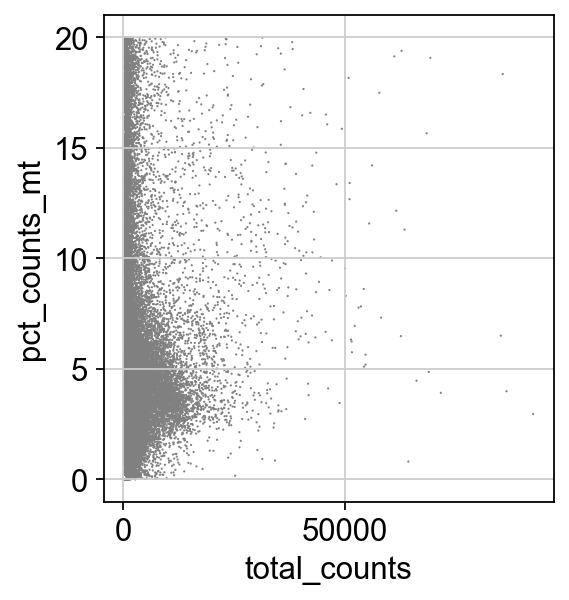

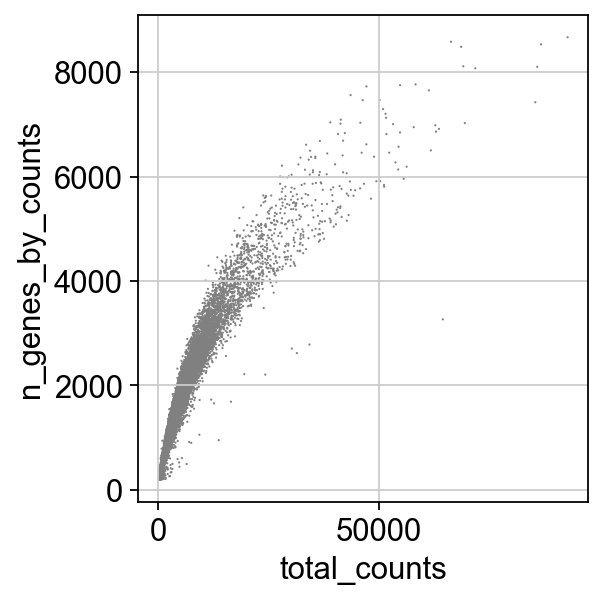

In [14]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [15]:
adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]

In [16]:
adata.layers['counts'] = adata.X

In [17]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [18]:
sc.pp.log1p(adata)

In [19]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


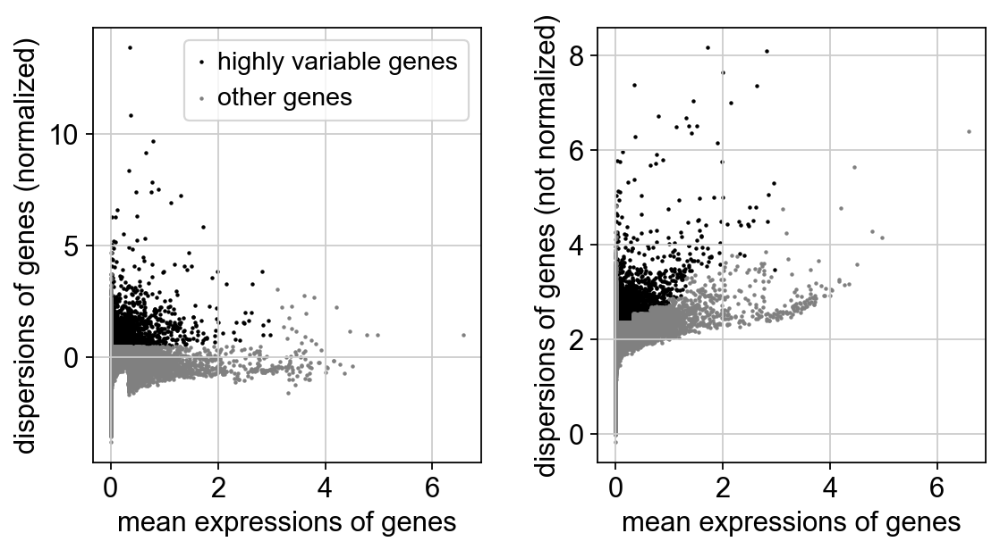

In [20]:
sc.pl.highly_variable_genes(adata)

In [21]:
adata.raw = adata

In [22]:
adata = adata[:, adata.var.highly_variable]

In [23]:
# sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

In [24]:
sc.pp.scale(adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [25]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


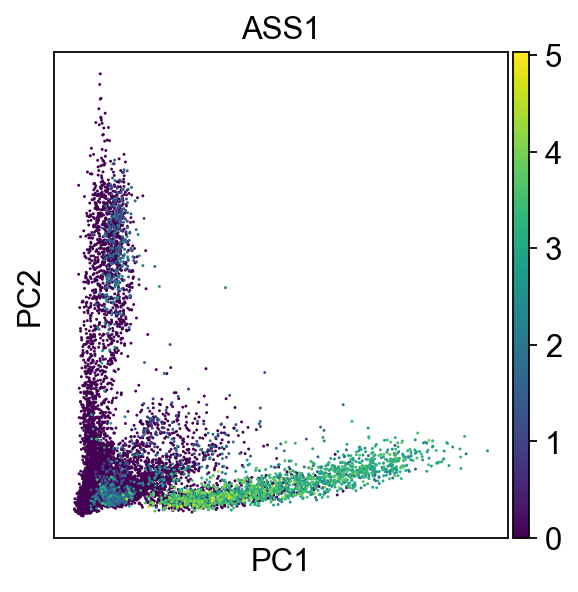

In [26]:
sc.pl.pca(adata, color='ASS1')

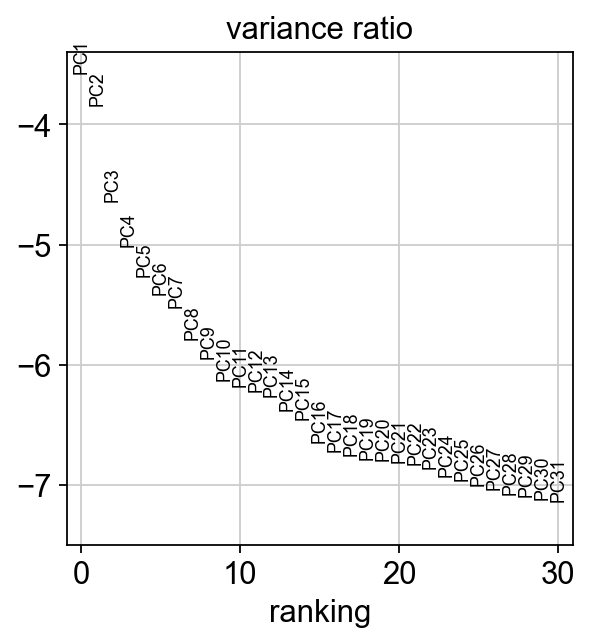

In [27]:
sc.pl.pca_variance_ratio(adata, log=True)

In [28]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)


In [29]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


### Plotting the expression of ccRCC markers as well as ASS1 in a UMAP

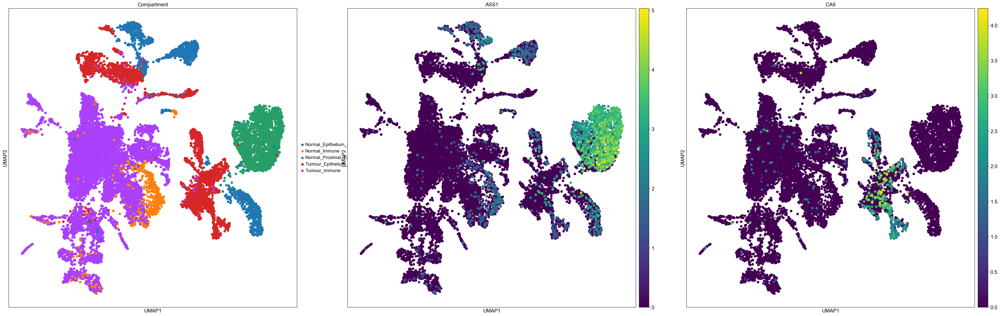

In [30]:
sc.set_figure_params(figsize=(15,15))
sc.pl.umap(adata, color=['Compartment', 'ASS1','CA9'], size=200)

Normal epithelium, normal immune and normal proximal tubule cells both display homogeneous expression of ASS1 (that is, not all cell express ASS1, but many cells express it and are homogeneously spread across the cell cluster). In contrast, the vast majority of tumor immune cells do not express ASS1. More improtantly, most tumor epithelial cells do not express ASS1, except for a number of tumor cells that clearly displays its expression. This would indicate that a subset of tumor cell have normal levels of expression of ASS1. Some of them seems to be scattered in the cluster with high level of ASS1 expression, while other seems to be more closelly related and have relativelly lower level of expression of ASS1 (compared to the isolated ASS1 expressing cells of the tumor). 
On the other hand, BCAT1 expression doesn't seem to be well captured in this dataset and is mostly dropped out, as only very few cells overall seesm to show its expression (BCAT1 would be expected to at least be expressed in normal cells).  

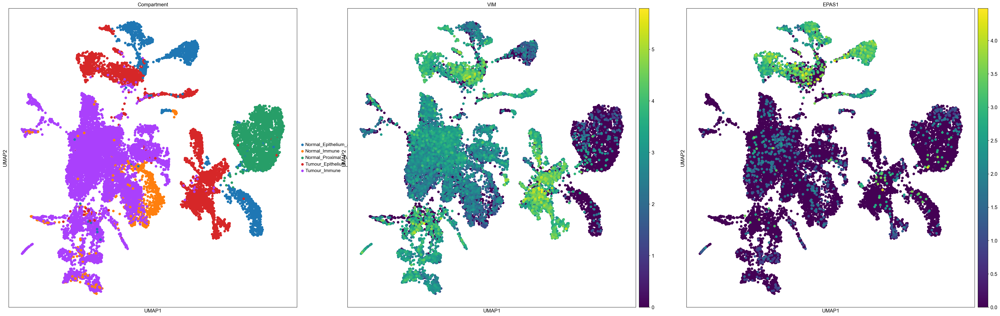

In [31]:
sc.pl.umap(adata, color=['Compartment','VIM','EPAS1'], size=200)

Tumor cells appear to express more VIM than normal cells. EPAS1 seems to be expressed in specific subsets of normal and tumor cells.

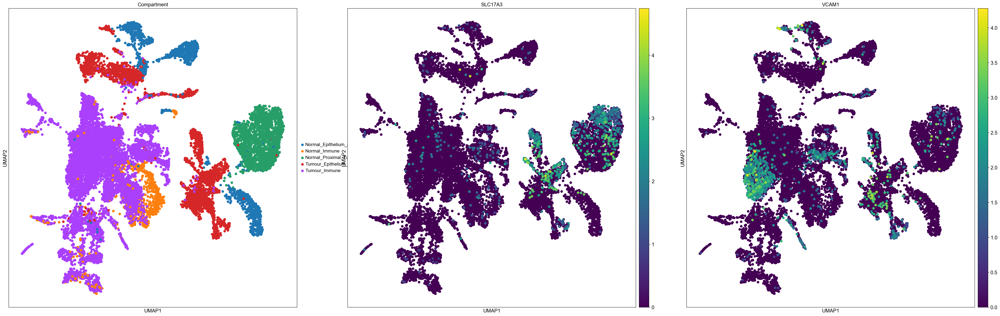

In [32]:
sc.pl.umap(adata, color=['Compartment','SLC17A3','VCAM1'], size=200)

In [33]:
#list(adata.obs.Source.unique())

### Focus on CCRCC patient 1

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50


/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


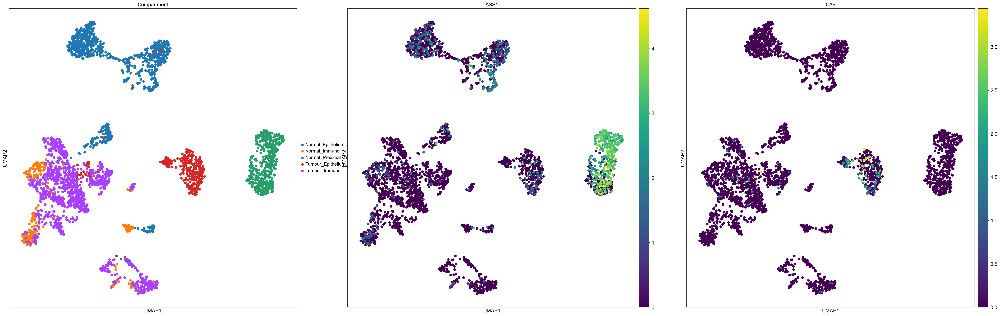

In [34]:
patient = "RCC1"
adata_filtered_patient = adata[np.isin(adata.obs.Compartment, ['Normal_Epithelium_and_Vascular_without_PT','Tumour_Epithelium_and_Vascular','Normal_Proximal_Tubules','Normal_Immune','Tumour_Immune']) & [patient in i for i in list(adata.obs.Source)]].raw.to_adata()
sc.pp.highly_variable_genes(adata_filtered_patient)
adata_filtered_patient.raw = adata_filtered_patient
adata_filtered_patient = adata_filtered_patient[:, adata_filtered_patient.var.highly_variable]
sc.pp.scale(adata_filtered_patient, max_value=10)
sc.tl.pca(adata_filtered_patient, svd_solver='arpack')
sc.pp.neighbors(adata_filtered_patient, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_filtered_patient)
sc.set_figure_params(figsize=(15,15))
sc.pl.umap(adata_filtered_patient, color=['Compartment', 'ASS1','CA9'], size=200)

### Focus on CCRCC patient 2

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


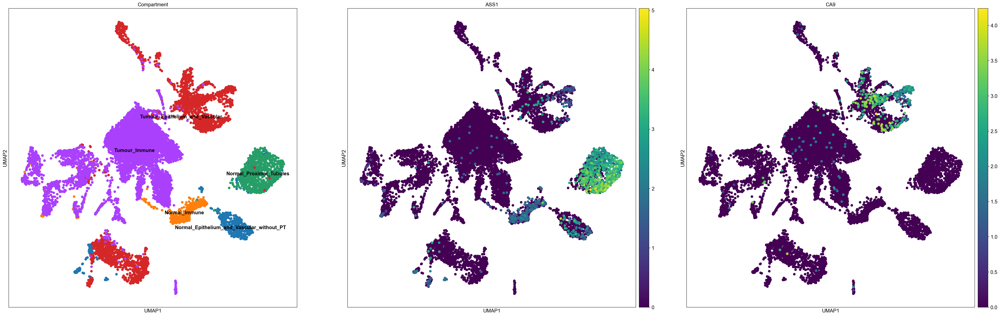

In [35]:
patient = "RCC2"
adata_filtered_patient = adata[np.isin(adata.obs.Compartment, ['Normal_Epithelium_and_Vascular_without_PT','Tumour_Epithelium_and_Vascular','Normal_Proximal_Tubules','Normal_Immune','Tumour_Immune']) & [patient in i for i in list(adata.obs.Source)]].raw.to_adata()
sc.pp.highly_variable_genes(adata_filtered_patient)
adata_filtered_patient.raw = adata_filtered_patient
adata_filtered_patient = adata_filtered_patient[:, adata_filtered_patient.var.highly_variable]
sc.pp.scale(adata_filtered_patient, max_value=10)
sc.tl.pca(adata_filtered_patient, svd_solver='arpack')
sc.pp.neighbors(adata_filtered_patient, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_filtered_patient)
sc.set_figure_params(figsize=(15,15))
sc.pl.umap(adata_filtered_patient, color=['Compartment', 'ASS1','CA9'], size=200, legend_loc='on data')

### Focus on CCRCC VHL patient (not many cells sadly)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50


/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:04)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


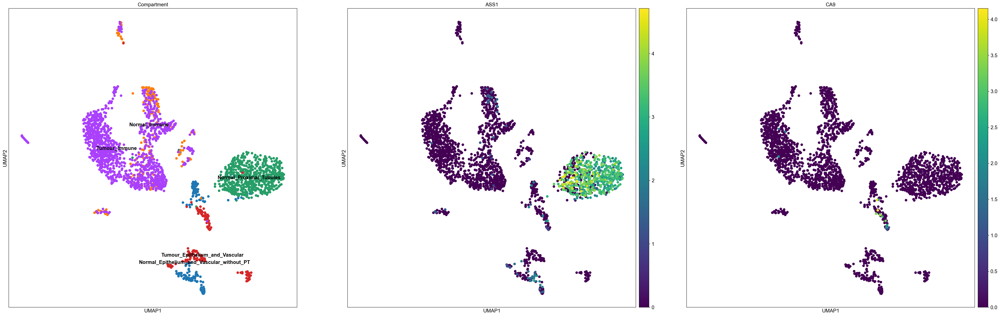

In [36]:
patient = "VHL"
adata_filtered_patient = adata[np.isin(adata.obs.Compartment, ['Normal_Epithelium_and_Vascular_without_PT','Tumour_Epithelium_and_Vascular','Normal_Proximal_Tubules','Normal_Immune','Tumour_Immune']) & [patient in i for i in list(adata.obs.Source)]].raw.to_adata()
sc.pp.highly_variable_genes(adata_filtered_patient)
adata_filtered_patient.raw = adata_filtered_patient
adata_filtered_patient = adata_filtered_patient[:, adata_filtered_patient.var.highly_variable]
sc.pp.scale(adata_filtered_patient, max_value=10)
sc.tl.pca(adata_filtered_patient, svd_solver='arpack')
sc.pp.neighbors(adata_filtered_patient, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_filtered_patient)
sc.set_figure_params(figsize=(15,15))
sc.pl.umap(adata_filtered_patient, color=['Compartment', 'ASS1','CA9'], size=200, legend_loc='on data')

### Violin plot of ASS1 and EPAS1 expression in different cell types

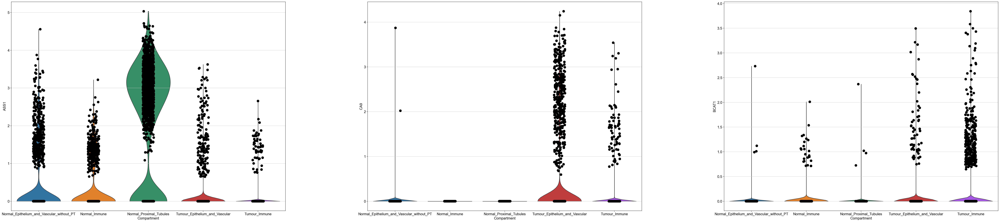

In [37]:
sc.pl.violin(adata, ['ASS1', 'CA9', 'BCAT1'], groupby='Compartment', size = 10)

In [38]:
#adata_filtered_patient_epith = adata_filtered_patient[np.isin(adata_filtered_patient.obs.Compartment, ['Normal_Epithelium_and_Vascular_without_PT','Tumour_Epithelium_and_Vascular'])].raw.to_adata()
#df = sc.get.obs_df(adata_filtered_patient_epith, ['ASS1', 'Compartment'])
#df = df.set_index('Compartment').stack().reset_index()
#df.columns = ['Compartment', 'gene', 'value']
#
#sns.violinplot(data=df, x='gene', y='value', hue="Compartment",
#                split=True, inner="quart", linewidth=1)  
#sns.stripplot(data=df, x='gene', y='value', hue="Compartment",
#                split=True)  

In [39]:
#adata_filtered_patient.obs['ASS1_expressed'] = adata_filtered_patient.raw.to_adata()[:,'ASS1'].X.A >  1.5
#adata_filtered_patient.obs['ASS1_expressed'] = adata_filtered_patient.obs['ASS1_expressed'].astype(str)

In [40]:
#sc.pl.umap(adata_filtered_patient, color=['Compartment', 'ASS1','ASS1_expressed'], size=100, legend_loc='on data', )

### Preparing data for pseudobulked differential analysis

In [41]:
adata.obs['is_tumor'] = np.isin(adata.obs.Compartment, ['Tumour_Immune','Tumour_Epithelium_and_Vascular'])
adata.obs['is_tumor'] = adata.obs['is_tumor'].astype(str)

In [42]:
adata.obs['Compartment'] = adata.obs['Compartment'].str.replace("Normal_","",regex = True)
adata.obs['Compartment'] = adata.obs['Compartment'].str.replace("Tumour_","",regex = True)
adata.obs['Compartment'] = adata.obs['Compartment'].str.replace("_without_PT","",regex = True)

In [43]:
adata.obs['ASS1_expressed'] = adata.raw.to_adata()[:,'ASS1'].X.A >  1.5
adata.obs['ASS1_expressed'] = adata.obs['ASS1_expressed'].astype(str)
adata.obs['Compartment_ASS1'] = adata.obs['Compartment'].astype(str) + "_ASS1_expresed_is_" + adata.obs['ASS1_expressed'].astype(str)

In [44]:
adata.obs['Compartment'].unique()

array(['Epithelium_and_Vascular', 'Immune', 'Proximal_Tubules'],
      dtype=object)

In [45]:
adata

AnnData object with n_obs × n_vars = 17255 × 4712
    obs: 'barcode', 'SangerID', 'ClusterID', 'Compartment', 'nUMI', 'nGenes', 'MTfrac', 'QCpass', 'Source', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'is_tumor', 'ASS1_expressed', 'Compartment_ASS1'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'Compartment_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [46]:
adata.layers

Layers with keys: counts

### Pseudobulking data

In [47]:
padata = dc.get_pseudobulk(adata, sample_col='Source', groups_col='Compartment', layer='counts', min_prop=0.05, min_smpls=1)

/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/decoupler/utils_anndata.py:203: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  psbulk = AnnData(psbulk, obs=new_obs, var=new_var)


In [48]:
sc.pp.normalize_total(padata, target_sum=1e4)
sc.pp.log1p(padata)
padata

normalizing counts per cell
    finished (0:00:00)


/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


AnnData object with n_obs × n_vars = 51 × 3686
    obs: 'SangerID', 'Compartment', 'QCpass', 'Source', 'is_tumor'
    uns: 'log1p'

### Comparison between tumor and "normal" cells

In [49]:
logFCs, pvals = dc.get_contrast(padata,
                                group_col='Compartment',
                                condition_col='is_tumor',
                                condition='True',
                                reference='False',
                                method='t-test'
                               )
logFCs

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


Skipping group "Proximal_Tubules" since condition "True" not in column "is_tumor".


,AP006222.2,FAM41C,HES4,ISG15,AGRN,TNFRSF18,TNFRSF4,FAM132A,CPTP,DVL1,...,TRPM2,PTTG1IP,FAM207A,COL18A1,COL6A1,COL6A2,FTCD,SPATC1L,S100B,AC007325.4
Epithelium_and_Vascular,0.813156,0.0,0.950026,-0.160997,0.770729,0.0,0.974819,0.346723,-1.020827,-1.488487,...,0.0,-0.20591,0.825129,0.908003,-0.251999,0.752014,-3.463116,0.0,3.177897,-0.47966
Immune,0.070864,-0.423176,-0.666326,-0.071412,0.0,1.344004,2.012847,0.0,0.155876,0.0,...,1.024911,0.111479,0.414827,0.813595,-0.062746,-0.984358,-6.305344,-0.197487,-0.598546,-0.607458


In [50]:
logFCs[logFCs.columns] = logFCs[logFCs.columns].apply(pd.to_numeric)

In [51]:
logFCs.values

array([[ 0.81315631,  0.        ,  0.95002586, ...,  0.        ,
         3.17789674, -0.47965986],
       [ 0.07086427, -0.42317614, -0.66632563, ..., -0.19748691,
        -0.59854639, -0.60745811]])

/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='logFC', ylabel='Density'>

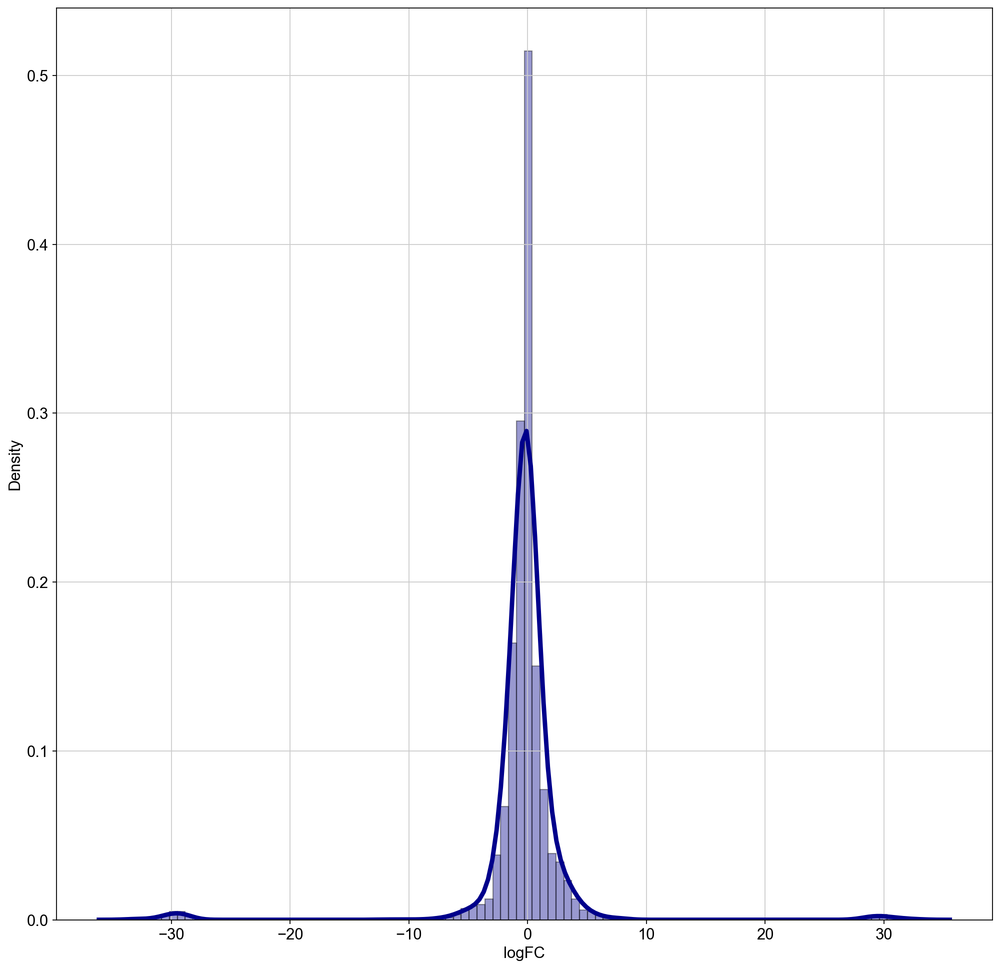

In [52]:
deg = dc.format_contrast_results(logFCs, pvals)
deg[deg["contrast"] == 'Epithelium_and_Vascular'].head(50)
sns.distplot(deg[deg["contrast"] == 'Epithelium_and_Vascular']["logFC"], hist=True, kde=True, 
             bins=int(500/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='logFC', ylabel='Density'>

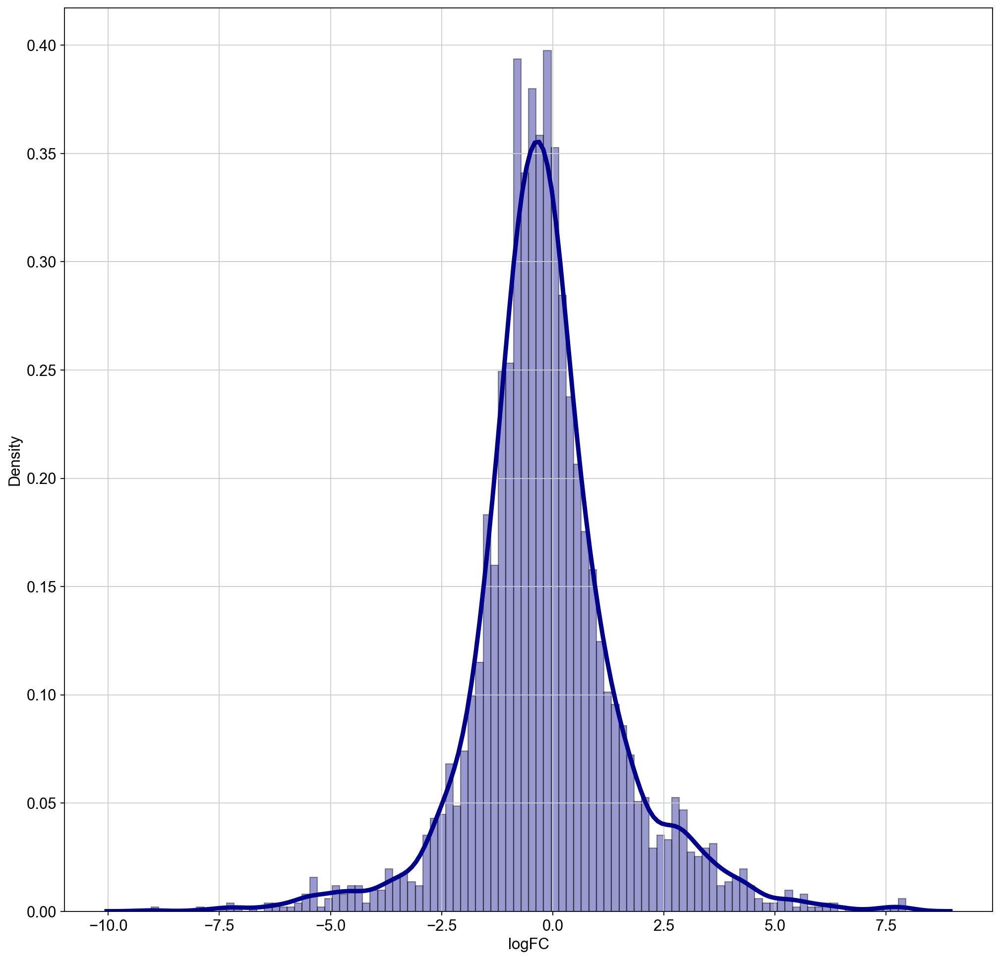

In [53]:
deg = deg[deg.logFC.values < 10]
deg = deg[deg.logFC.values > -10]
deg = deg[deg.logFC.values != 0]
sns.distplot(deg[deg["contrast"] == 'Epithelium_and_Vascular']["logFC"], hist=True, kde=True, 
             bins=int(500/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [54]:
deg[deg["name"] == "ASS1"]

,contrast,name,logFC,pval
40,Epithelium_and_Vascular,ASS1,-1.979514,0.000013
48,Immune,ASS1,-4.687952,0.000016


In [55]:
deg[deg["name"] == "BCAT1"]

,contrast,name,logFC,pval
783,Epithelium_and_Vascular,BCAT1,3.104620,0.010795
1384,Immune,BCAT1,1.317121,0.044577


In [56]:
deg[deg["name"] == "GLUL"]

,contrast,name,logFC,pval
425,Epithelium_and_Vascular,GLUL,-1.099327,0.002715
5089,Immune,GLUL,-0.031392,0.918313


### Progeny anaylsis of tumor vs "normal"

In [57]:
# Retrieve PROGENy model weights
progeny = dc.get_progeny(top=300)

# Infer pathway activities with mlm
pathway_acts, pathway_pvals = dc.run_mlm(mat=logFCs, net=progeny, source='source', target='target', weight='weight', )
pathway_acts

,Androgen,EGFR,Estrogen,Hypoxia,JAK-STAT,MAPK,NFkB,PI3K,TGFb,TNFa,Trail,VEGF,WNT,p53
Epithelium_and_Vascular,-0.622776,0.023126,0.533816,3.324568,0.388519,0.072155,0.213303,-0.376993,0.744033,0.008566,-2.823359,0.198478,0.612139,0.365630
Immune,-0.245061,-0.093172,-0.376814,3.654325,1.504736,-0.168990,-0.232595,0.150864,1.954179,0.422688,-1.256402,-0.597414,0.497345,-1.385351


In [58]:
progeny

,source,target,weight,p_value
0,Androgen,TMPRSS2,11.490631,0.000000e+00
1,Androgen,NKX3-1,10.622551,2.242078e-44
2,Androgen,MBOAT2,10.472733,4.624285e-44
3,Androgen,KLK2,10.176186,1.944414e-40
4,Androgen,SARG,11.386852,2.790209e-40
...,...,...,...,...
4195,p53,F5,2.397854,5.746843e-08
4196,p53,MKI67,-5.680340,5.758565e-08
4197,p53,THOC2,-2.108178,5.858359e-08
4198,p53,POLA1,-4.943873,5.911873e-08


### TF activity analysis of tumor vs "normal"

In [59]:
# Retrieve DoRothEA gene regulatory network
dorothea = dc.get_dorothea()

# Infer pathway activities with mlm
tf_acts, tf_pvals = dc.run_mlm(mat=logFCs, net=dorothea, source='source', target='target', weight='weight')
tf_acts

,AHR,AR,ARNT,ASCL1,ATF1,ATF2,ATF3,ATF4,ATF7,BACH1,...,YY1,ZBTB7A,ZEB1,ZEB2,ZFX,ZKSCAN1,ZNF143,ZNF24,ZNF263,ZNF384
Epithelium_and_Vascular,-0.528930,0.440498,1.202645,0.098777,0.636739,-0.026554,0.524343,1.338917,-0.197054,-0.823449,...,0.625156,-0.765785,-0.269299,0.169720,-0.058416,0.633418,-0.587634,0.402045,0.579383,-0.616718
Immune,-0.188516,-0.302787,-0.201573,-0.464812,1.201231,0.381235,-0.880227,-0.062096,-0.033954,-0.413839,...,-0.267652,-0.342222,0.818472,0.274058,-0.321672,0.630000,-0.567394,0.338063,-0.224621,0.463316


### Preparing pseudobulk of ASS1 expressing cancer cells

In [60]:
padata_ASS1 = dc.get_pseudobulk(adata, sample_col='Source', groups_col='Compartment_ASS1', layer='counts', min_prop=0.05, min_smpls=1)
sc.pp.normalize_total(padata_ASS1, target_sum=1e4)
sc.pp.log1p(padata_ASS1)
padata_ASS1

normalizing counts per cell
    finished (0:00:00)


/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/decoupler/utils_anndata.py:203: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  psbulk = AnnData(psbulk, obs=new_obs, var=new_var)
/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


AnnData object with n_obs × n_vars = 72 × 4163
    obs: 'SangerID', 'Compartment', 'QCpass', 'Source', 'is_tumor', 'ASS1_expressed', 'Compartment_ASS1'
    uns: 'log1p'

In [61]:
padata_ASS1.obs.Compartment_ASS1.unique()

array(['Epithelium_and_Vascular_ASS1_expresed_is_False',
       'Epithelium_and_Vascular_ASS1_expresed_is_True',
       'Immune_ASS1_expresed_is_False', 'Immune_ASS1_expresed_is_True',
       'Proximal_Tubules_ASS1_expresed_is_False',
       'Proximal_Tubules_ASS1_expresed_is_True'], dtype=object)

### Differential anylsis between ASS1 cancer cells and other cancer cells

In [62]:
logFCs, pvals = dc.get_contrast(padata_ASS1,
                                group_col='is_tumor',
                                condition_col='Compartment_ASS1',
                                condition='Epithelium_and_Vascular_ASS1_expresed_is_True',
                                reference='Epithelium_and_Vascular_ASS1_expresed_is_False',
                                method='t-test'
                               )
logFCs

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


,AP006222.2,FAM41C,HES4,ISG15,AGRN,TNFRSF18,TNFRSF4,FAM132A,CPTP,DVL1,...,PTTG1IP,FAM207A,COL18A1,COL6A1,COL6A2,FTCD,SPATC1L,S100B,AC011043.1,AC007325.4
False,0.615263,0.0,-30.262264,-1.13903,0.014374,0.0,-29.888121,-28.413111,0.153789,-28.98934,...,-0.032598,-0.471703,-0.578688,-0.145025,-30.25934,1.537863,0.0,-23.651663,29.269009,0.520121
True,-0.061539,0.0,-31.291611,-0.973183,-30.407473,29.103266,-30.937588,-28.761116,0.278546,-27.343489,...,0.292476,0.550223,-2.802676,-0.532447,-30.960546,-26.412716,0.0,-26.612715,28.659264,1.403195


In [63]:
logFCs[logFCs.columns] = logFCs[logFCs.columns].apply(pd.to_numeric)

/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='logFC', ylabel='Density'>

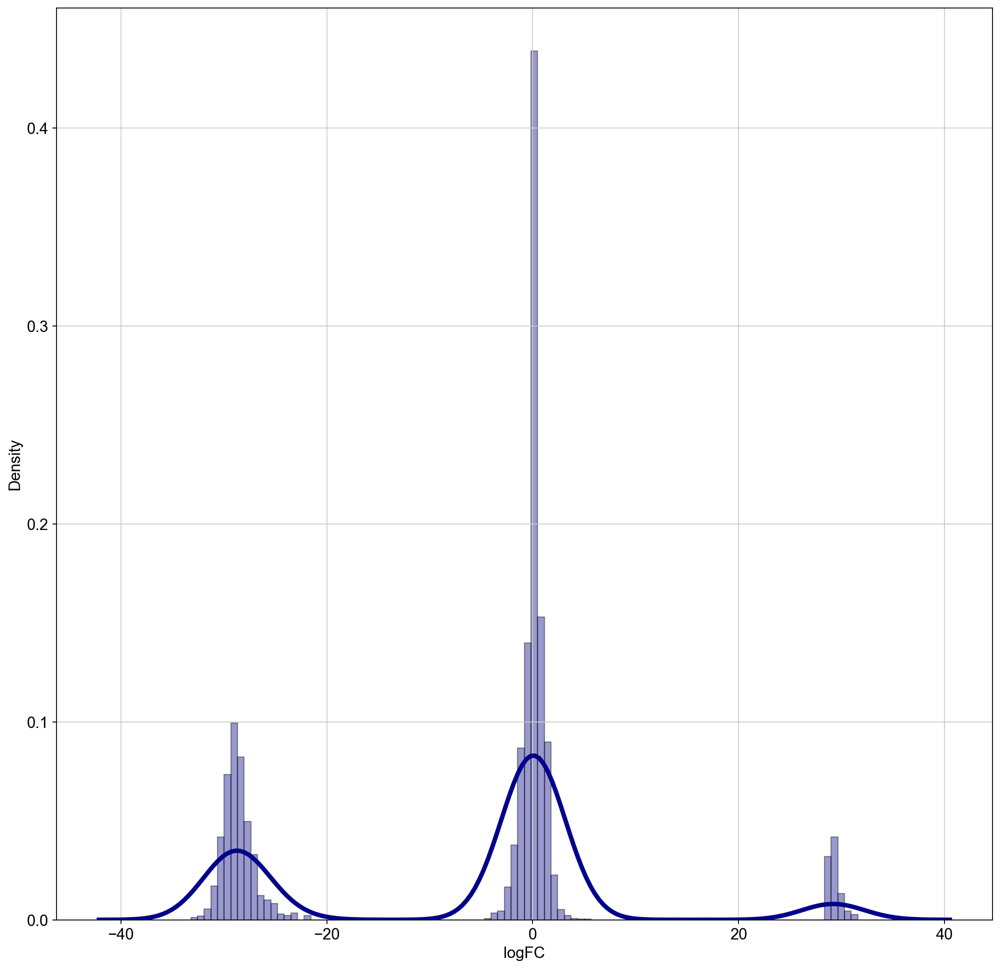

In [64]:
deg_ASS1 = dc.format_contrast_results(logFCs, pvals)
deg_ASS1[deg_ASS1["contrast"] == 'True'].head(50)
sns.distplot(deg_ASS1[deg_ASS1["contrast"] == 'True']["logFC"], hist=True, kde=True, 
             bins=int(500/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='logFC', ylabel='Density'>

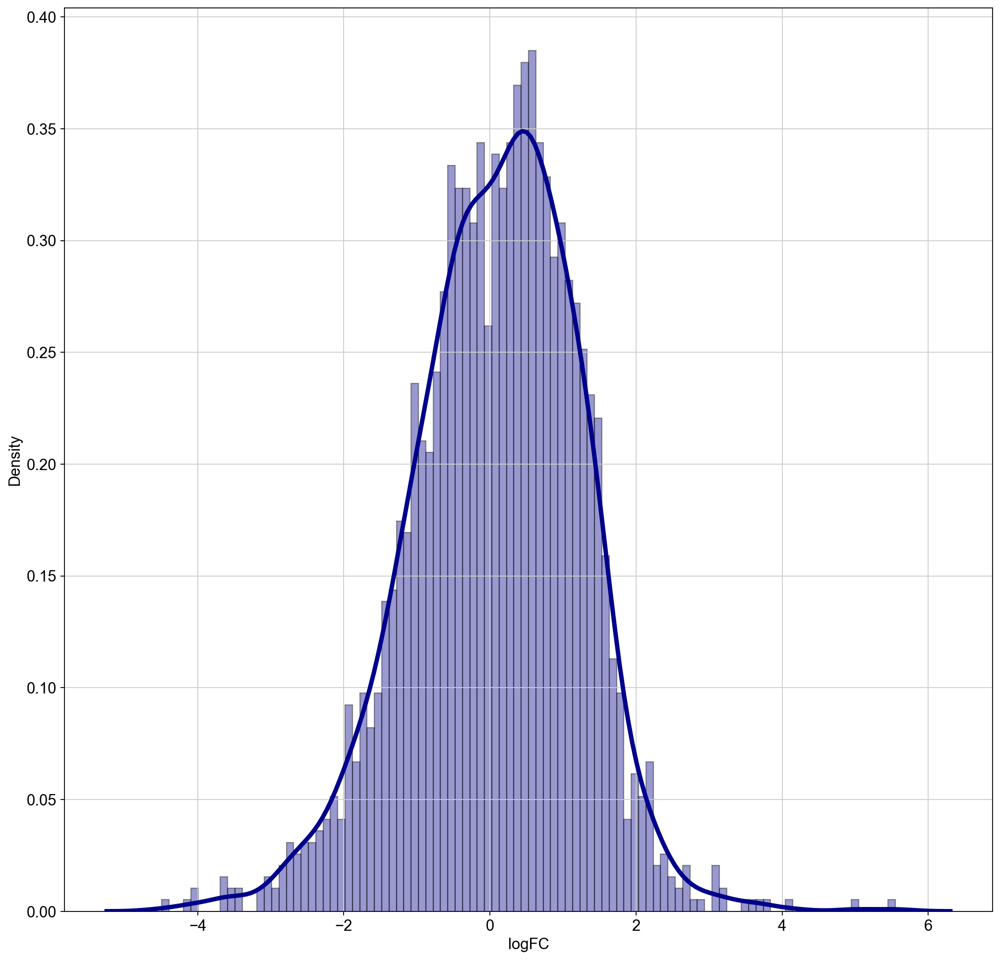

In [65]:
deg_ASS1 = deg_ASS1[deg_ASS1.logFC.values < 10]
deg_ASS1 = deg_ASS1[deg_ASS1.logFC.values > -10]
deg_ASS1 = deg_ASS1[deg_ASS1.logFC.values != 0]
sns.distplot(deg_ASS1[deg_ASS1["contrast"] == 'True']["logFC"], hist=True, kde=True, 
             bins=int(500/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [66]:
# Retrieve PROGENy model weights
progeny = dc.get_progeny(top=300)

# Infer pathway activities with mlm
pathway_acts, pathway_pvals = dc.run_mlm(mat=logFCs, net=progeny, source='source', target='target', weight='weight', )
pathway_acts

,Androgen,EGFR,Estrogen,Hypoxia,JAK-STAT,MAPK,NFkB,PI3K,TGFb,TNFa,Trail,VEGF,WNT,p53
False,-1.131816,-2.495776,0.742138,-1.014588,-0.393204,0.496855,-1.383344,-0.105985,-0.917007,-0.214661,0.712755,-0.094329,-0.302594,-1.307871
True,-1.903295,-2.047513,-1.615937,3.035408,0.536857,0.679014,0.551072,-1.260037,-0.841598,-0.788575,0.929772,-0.710999,-0.768446,0.325159


In [67]:
deg.to_csv(path_or_buf='../results/DA_tumorVsHealthy.csv')

In [68]:
deg_ASS1.to_csv(path_or_buf='../results/DA_ASS1vsNoASS1.csv')